# ECG Anomaly Detection

## Introduction and Business Problem

Doctors are in short supply worldwide.  Some areas, such as in central Africa and western and central Asia, have less than 1 medical doctor per 1,000 people (2018 data from the World Bank.)  [Medic Mobile](https://medic.org/) has contracted my company to research and develop a viable model that can identify and tag anomalous electrocardiographs from a dataset that contains normal and abnormal ECGs.  Medic Mobile is a nonprofit organization that strives to improve health care for those living in hard-to-reach communities.  Medic Mobile now impacts 14 countries in Africa and Asia, having trained and equipped 24,463 health workers.

### Imports

In [287]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import seaborn as sns
from tensorflow.keras.optimizers import Adam
from pylab import rcParams
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score
from sklearn.metrics import auc
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from tensorflow.keras.optimizers import Adam
from tensorflow.keras import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow import keras
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model

%matplotlib inline
%config InlineBackend.figure_format='retina'
sns.set(style="darkgrid", palette='muted', font_scale=1.2)
whimsy_pallette = ["#01BEFE", "#FFDD00", "#FF7D00", "#FF006D", "#ADFF02", "#8F00FF"]
sns.set_palette(sns.color_palette(whimsy_pallette))
rcParams['figure.figsize'] = 12, 8

### The Dataset

From [timeseriesclassification.com...](http://www.timeseriesclassification.com/description.php?Dataset=ECG5000) The original dataset for "ECG5000" is a 20-hour long ECG downloaded from Physionet. The name is BIDMC Congestive Heart Failure Database(chfdb) and it is record "chf07". It was originally published in "Goldberger AL, Amaral LAN, Glass L, Hausdorff JM, Ivanov PCh, Mark RG, Mietus JE, Moody GB, Peng C-K, Stanley HE. PhysioBank, PhysioToolkit, and PhysioNet: Components of a New Research Resource for Complex Physiologic Signals. Circulation 101(23)". The data was pre-processed in two steps: (1) extract each heartbeat, (2) make each heartbeat equal length using interpolation. This dataset was originally used in paper "A general framework for never-ending learning from time series streams", DAMI 29(6). After that, 5,000 heartbeats were randomly selected. The patient has severe congestive heart failure and the class values were obtained by automated annotation. The dataset is stationary.

In [288]:
data_path = 'data/ecg.csv'
data = pd.read_csv(data_path, header=None)
data.head()

,0,1,2,3,4,5,6,7,8,9,...,131,132,133,134,135,136,137,138,139,140
0,-0.112522,-2.827204,-3.773897,-4.349751,-4.376041,-3.474986,-2.181408,-1.818286,-1.250522,-0.477492,...,0.792168,0.933541,0.796958,0.578621,0.257740,0.228077,0.123431,0.925286,0.193137,1.0
1,-1.100878,-3.996840,-4.285843,-4.506579,-4.022377,-3.234368,-1.566126,-0.992258,-0.754680,0.042321,...,0.538356,0.656881,0.787490,0.724046,0.555784,0.476333,0.773820,1.119621,-1.436250,1.0
2,-0.567088,-2.593450,-3.874230,-4.584095,-4.187449,-3.151462,-1.742940,-1.490659,-1.183580,-0.394229,...,0.886073,0.531452,0.311377,-0.021919,-0.713683,-0.532197,0.321097,0.904227,-0.421797,1.0
3,0.490473,-1.914407,-3.616364,-4.318823,-4.268016,-3.881110,-2.993280,-1.671131,-1.333884,-0.965629,...,0.350816,0.499111,0.600345,0.842069,0.952074,0.990133,1.086798,1.403011,-0.383564,1.0
4,0.800232,-0.874252,-2.384761,-3.973292,-4.338224,-3.802422,-2.534510,-1.783423,-1.594450,-0.753199,...,1.148884,0.958434,1.059025,1.371682,1.277392,0.960304,0.971020,1.614392,1.421456,1.0


You can see by scrolling to the last column that it contains the labels - 0 is an anomalous heartbeat, 1 is a normal heartbeat.

In [289]:
data.shape

(4998, 141)

In [290]:
data[140].value_counts()

1.0    2919
0.0    2079
Name: 140, dtype: int64

### Drop target from data; create target df with labels

In [291]:
raw_data = data.values

# The last element contains the labels
target = raw_data[:, -1]

# The other data points are the electrocadriogram data
features = raw_data[:, 0:-1]



### Train Test Split

In [292]:
x_train, x_test, y_train, y_test = train_test_split(
    features, target, test_size=0.2, random_state=21,
)

### Scale the input

In [293]:
min_val = tf.reduce_min(x_train)
max_val = tf.reduce_max(x_train)

x_train = (x_train - min_val) / (max_val - min_val)
x_test = (x_test - min_val) / (max_val - min_val)

x_train = tf.cast(x_train, tf.float32)
x_test = tf.cast(x_test, tf.float32)

### Separate the normal and anomalous ECGs

In [294]:
y_train = y_train.astype(bool)
y_test = y_test.astype(bool)

x_norm_train = x_train[y_train]
x_norm_test = x_test[y_test]

x_abnorm_train = x_train[~y_train]
x_abnorm_test = x_test[~y_test]

### Plot a normal ECG and abnormal ECG

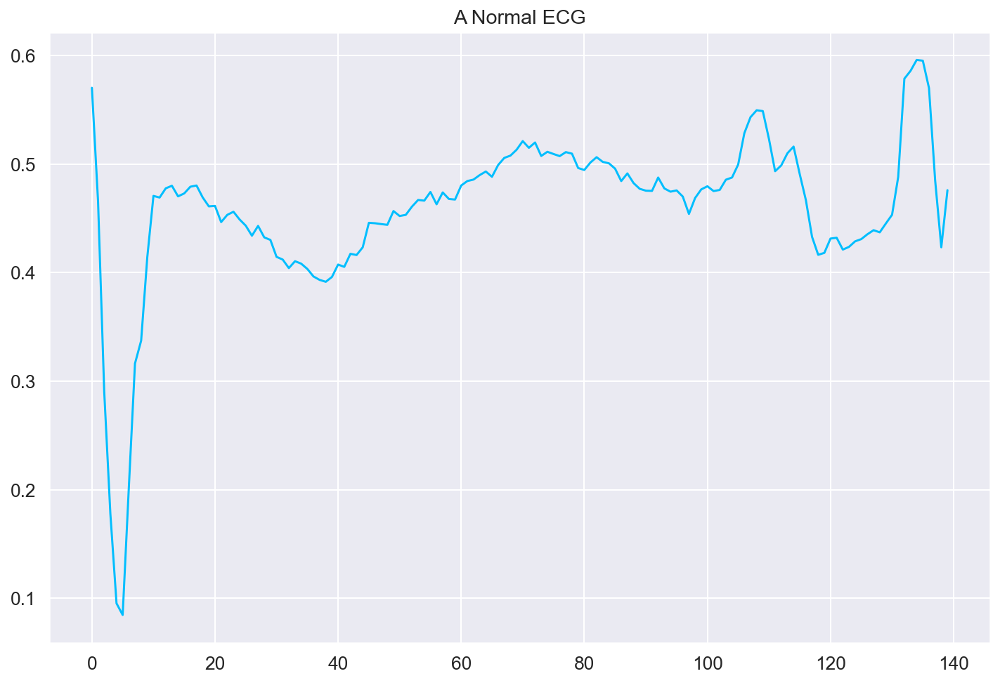

In [295]:
# 1st ECG in the normal set
plt.plot(np.arange(140), x_norm_train[0])
plt.title("A Normal ECG")
plt.savefig('images/normal_ecg.jpg', dpi=300, pad_inches=0.1,)
plt.show()

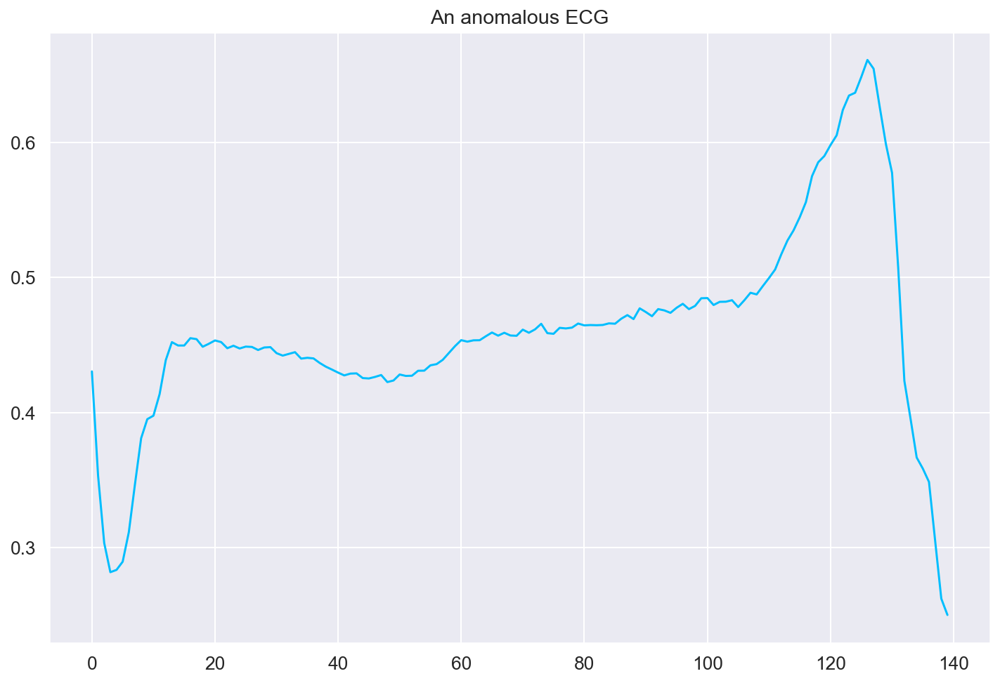

In [296]:
# 1st ECG in the abnormal set
plt.plot(np.arange(140), x_abnorm_train[0])
plt.title("An anomalous ECG")
plt.savefig('images/anomalous_ecg.jpg', dpi=300, pad_inches=0.1,)
plt.show()

## What is an autoencoder?
    
An autoencoder is an unsupervised artificial neural network that attempts to encode the data by compressing it into lower dimensions and the decode the data to reconstruct the original input.  The idea is that the reconstructed data would be as close as possible to the original.  The compressed representation of the input data is called the bottleneck layer.  The number of hidden units in the code is called the code size.  It has several used, one of which is for our purpose, anomaly detection.  Here's a simple diagram:

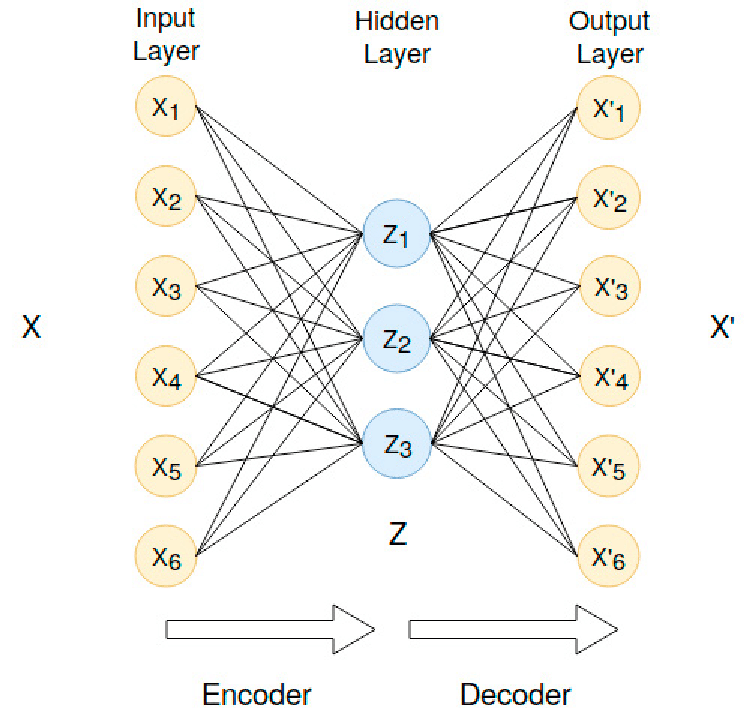



The code size, which is the size of the bottleneck, is the most important hyperperameter.  A small bottleneck lowers the risk of overfittings, but if it's too small,there is an increased chance of important information slipping out through the pooling layers of the encoder.

Autoencoding is essentially a non-linear version of Principal Component Analysis (PCA).  In fact, if you don't define any activations, and set the cost function to mean squared error (MSE), the autoencoder ends up performing PCA.  The initial model below does exactly this:

## Base Model - PCA using an Neural Network Autoencoder

In [297]:
encoder = Sequential([
      Dense(3),      
      Dense(2),     
    ])
decoder = Sequential([
      Dense(4),     
      Dense(x_norm_train.shape[1])
    ])

In [298]:
autoencoder = keras.models.Sequential([encoder, decoder])

In [299]:
autoencoder.compile(loss='mse', optimizer='adam')

In [300]:
history = autoencoder.fit(
    x_norm_train,
    x_norm_train,
    epochs=15,
    batch_size=512,
    validation_data=(x_test, x_test)
)

Epoch 1/15
5/5 [==============================] - 0s 22ms/step - loss: 0.2157 - val_loss: 0.2103
Epoch 2/15
5/5 [==============================] - 0s 5ms/step - loss: 0.2071 - val_loss: 0.2023
Epoch 3/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1984 - val_loss: 0.1920
Epoch 4/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1869 - val_loss: 0.1791
Epoch 5/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1731 - val_loss: 0.1644
Epoch 6/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1577 - val_loss: 0.1485
Epoch 7/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1415 - val_loss: 0.1322
Epoch 8/15
5/5 [==============================] - 0s 5ms/step - loss: 0.1252 - val_loss: 0.1163
Epoch 9/15
5/5 [==============================] - 0s 6ms/step - loss: 0.1095 - val_loss: 0.1012
Epoch 10/15
5/5 [==============================] - 0s 6ms/step - loss: 0.0946 - val_loss: 0.0872
Epoch 11/15
5/5 [=====================

In [301]:
autoencoder.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_2 (Sequential)   (None, 2)                 431       
                                                                 
 sequential_3 (Sequential)   (None, 140)               712       
                                                                 
Total params: 1,143
Trainable params: 1,143
Non-trainable params: 0
_________________________________________________________________


### Training vs. Validation loss per epoch

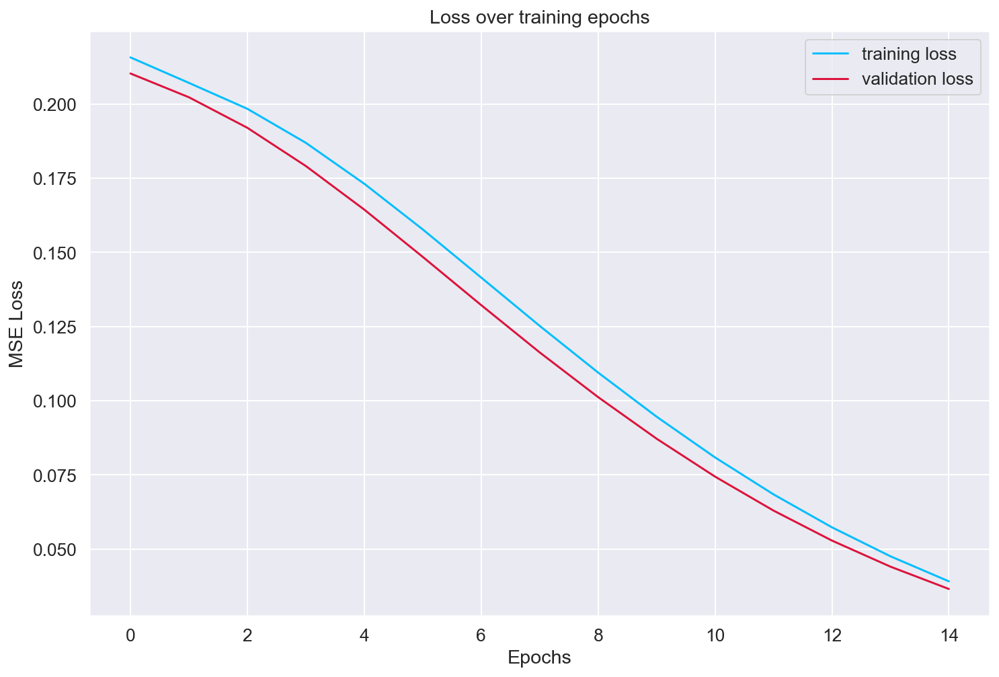

In [302]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Loss over training epochs')
plt.legend(['training loss', 'validation loss'])
plt.show();

### Input vs Reconstruction for a Normal ECG

In [303]:
encoded_imgs = encoder(x_norm_test).numpy()
decoded_imgs = decoder(encoded_imgs).numpy()

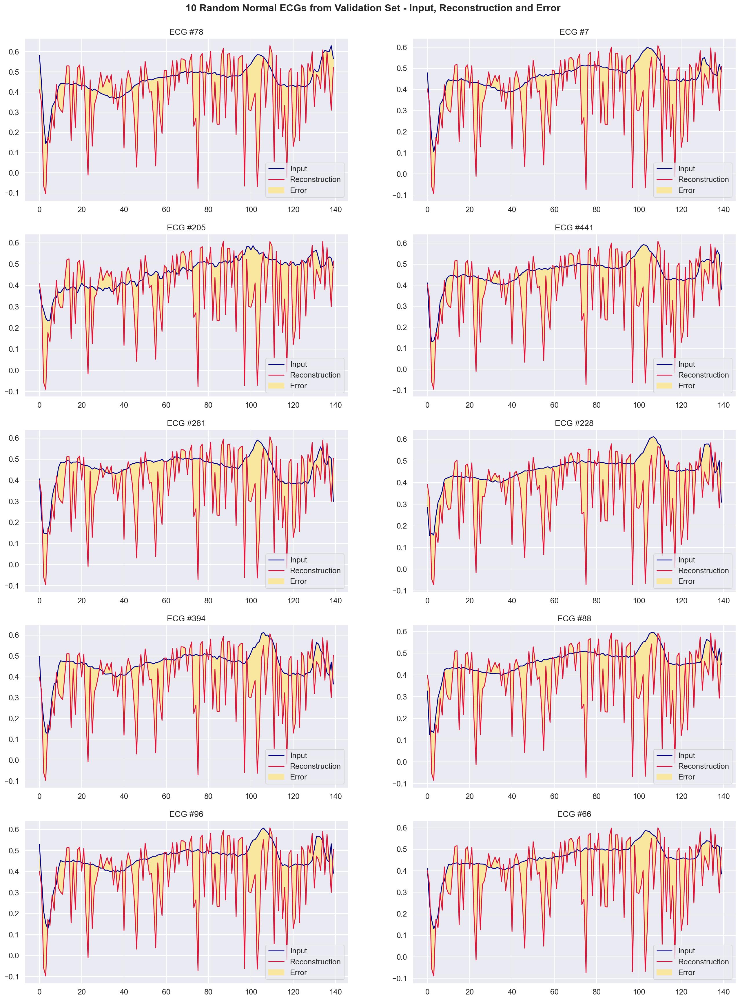

In [304]:
# Plot 10 random normal ECGs

a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(22,30))
fig.tight_layout()

for i in range(0,10):
    x = np.random.randint(low=0, high=(len(x_norm_test)-1))
    plt.subplot(a, b, c)
    plt.plot(x_norm_test[x],'darkblue',)
    plt.plot(decoded_imgs[x],'crimson')
    plt.fill_between(np.arange(140), decoded_imgs[x], x_norm_test[x], color='#F9E79F' )
    plt.title(f'ECG #{x+1}')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    c = c + 1

plt.suptitle('10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', 
             x=0.3, y=.9, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
plt.savefig('images/pca_model_1_norm_in_out.png', dpi=300, pad_inches=0.1,)
plt.show()

### Input vs Reconstruction for an Abnormal ECG

In [305]:
encoded_imgs = encoder(x_abnorm_test).numpy()
decoded_imgs = decoder(encoded_imgs).numpy()

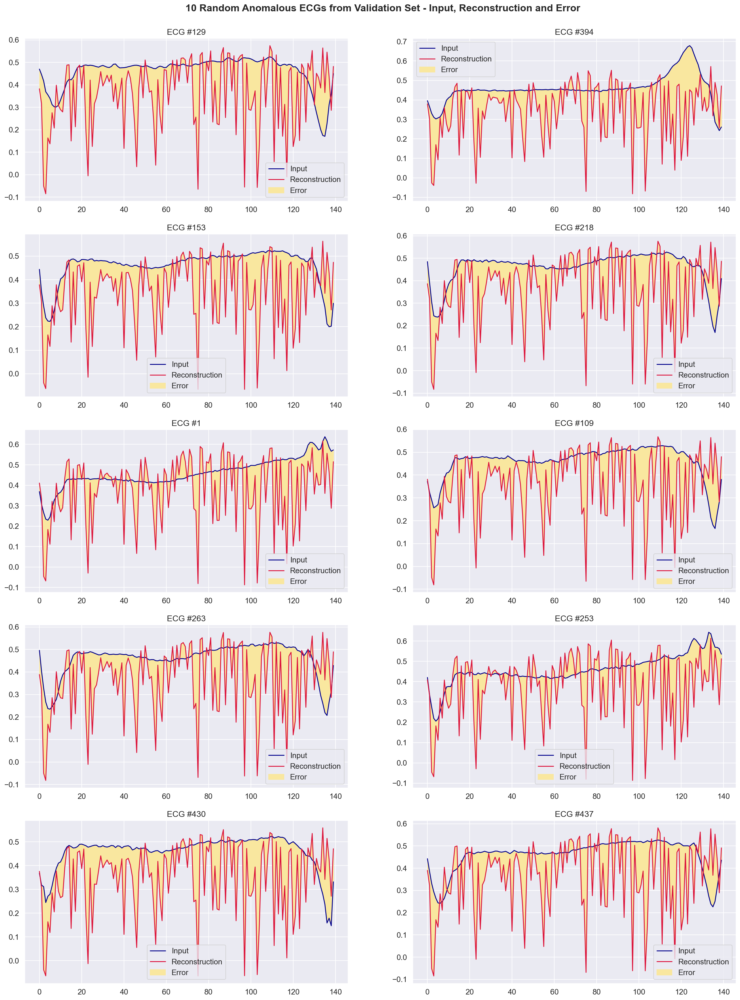

In [306]:
# Plot 10 random abnormal ECGs

a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(22,30))
fig.tight_layout()

for i in range(0,10):
    x = np.random.randint(low=0, high=(len(x_abnorm_test)-1))
    plt.subplot(a, b, c)
    plt.plot(x_abnorm_test[x],'darkblue',)
    plt.plot(decoded_imgs[x],'crimson')
    plt.fill_between(np.arange(140), decoded_imgs[x], x_abnorm_test[x], color='#F9E79F' )
    plt.title(f'ECG #{x+1}')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    c = c + 1

plt.suptitle('10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', 
             x=0.30, y=.9, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
plt.savefig('images/pca_model_1_abnorm_in_out.png', dpi=300, pad_inches=0.1,)
plt.show()

### Finding anomalous ECGs

We are calculating the mean squared error from examples from the normal training set, and then classifying as anomalous examples from the test set where the reconstruction error is 1 standard deviation from the training set.

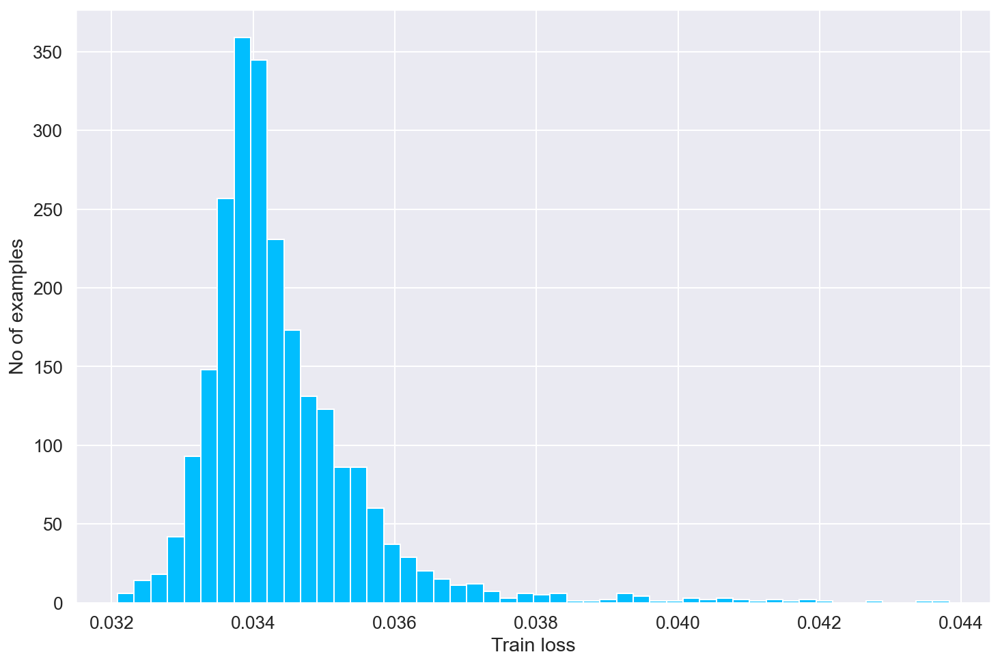

In [307]:
reconstructions = autoencoder.predict(x_norm_train)
train_loss = tf.keras.losses.mse(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=50)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

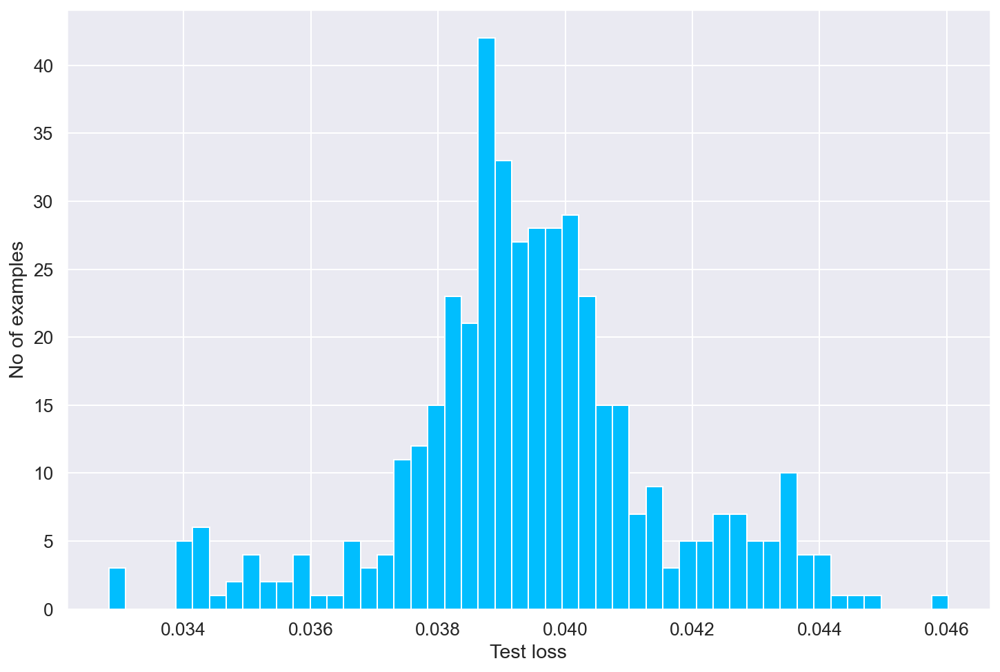

In [308]:
reconstructions = autoencoder.predict(x_abnorm_test)
test_loss = tf.keras.losses.mse(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=50)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [309]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.mse(reconstructions, x_train_scaled)

  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.mse(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

In [310]:
threshold = find_threshold(autoencoder, x_norm_train)
print(f"Threshold: {threshold}")

Threshold: 0.035599980503320694


In [311]:
preds = get_predictions(autoencoder, x_test, threshold)
preds.shape

(1000,)

In [312]:
def print_stats(predictions, labels):
  print(f"Accuracy = {accuracy_score(labels, preds)}")
  print(f"Precision = {precision_score(labels, preds)}")
  print(f"Recall = {recall_score(labels, preds)}")

In [313]:
print_stats(preds, y_test)

Accuracy = 0.919
Precision = 0.9561904761904761
Recall = 0.8964285714285715


#### Calculate F1 score and Area Under the Curve (AUC)

In [314]:
from sklearn.metrics import auc

precision, recall, thresholds = precision_recall_curve(y_test, preds)
auc = auc(recall, precision)
f1 = f1_score(y_test, preds)

#### Plot AUC & Confusion Matrix

Code adapted from [machine learning mastery](https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-classification-in-python/).

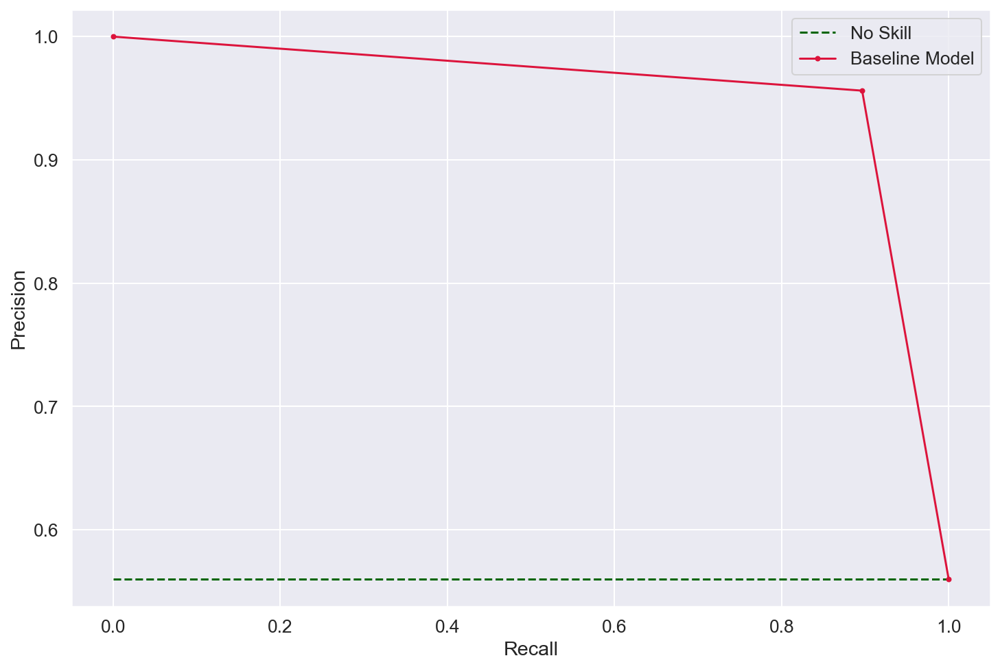

In [315]:
# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', color = 'darkgreen',label='No Skill')
plt.plot(recall, precision, marker='.', color = 'crimson', label='Baseline Model')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show();

In [316]:
# summarize scores
print('Autoencoder - PCA: f1=%.3f auc=%.3f' % (f1, auc))

Autoencoder - PCA: f1=0.925 auc=0.955


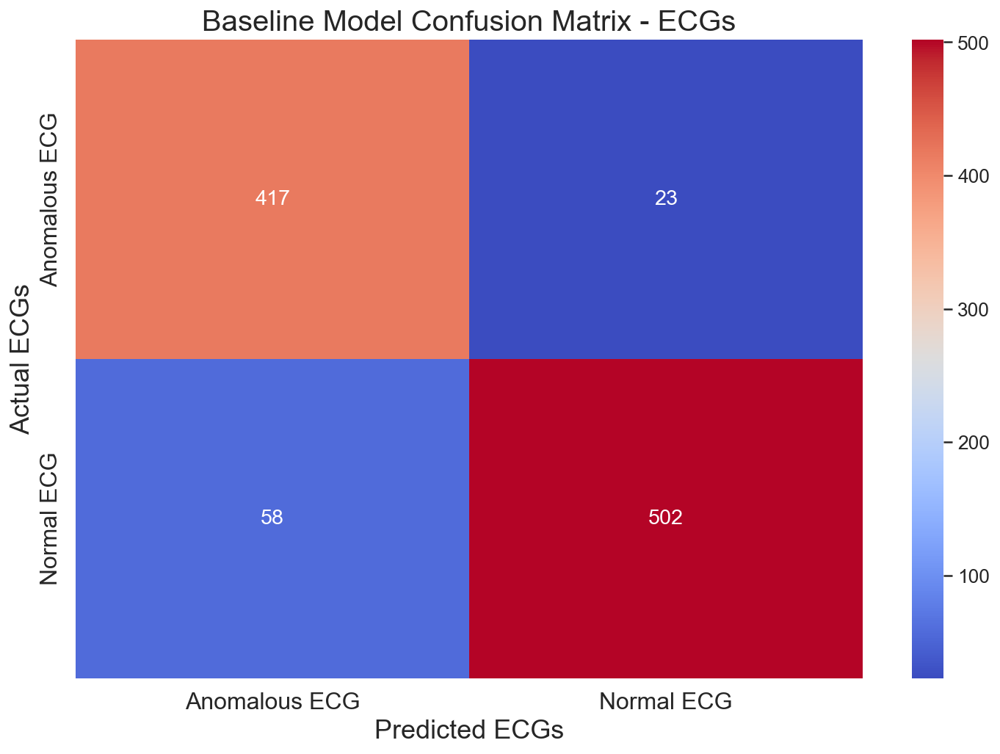

In [317]:
# Plot Confusion Matrix

cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Baseline Model Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/pca_model_1_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This was not terrible - accuracy was around 90%.  Although this might be great for predicting if people like pickles on their hamburger, predicting a heart condition requires a more strigent expectation.  We want to lean into the top right hand corner of the confusion matrix - this cell tells us the the ECGs we predicted as normal, but they are really anomalous.  Since we don't want to tell people their heart is normal when it's really not, we want to reduce this number as much as possible, even at the expense of telling people they might have a heart condition when they really do not.  That's the number in the bottom left box.

Before we leave PCA, let's take one more shot with some adjusted parameters.  

## PCA using an Autoencoder - Take 2

The only changes we'll make is to adjust the first layer of both the encoder and decoder to 8 inputs.  We'll leave the bottleneck at 2 inputs.

In [318]:
encoder = Sequential([
      Dense(8),      
      Dense(2),     
    ])
decoder = Sequential([
      Dense(8),     
      Dense(x_norm_train.shape[1])
    ])

In [319]:
pca_model_2 = keras.models.Sequential([encoder, decoder])

In [320]:
pca_model_2.compile(loss='mse', optimizer='adam')

In [321]:
history = pca_model_2.fit(
    x_norm_train,
    x_norm_train,
    epochs=20,
    batch_size=512,
    validation_data=(x_test, x_test)
)

Epoch 1/20
5/5 [==============================] - 0s 23ms/step - loss: 0.2236 - val_loss: 0.2096
Epoch 2/20
5/5 [==============================] - 0s 5ms/step - loss: 0.2053 - val_loss: 0.2000
Epoch 3/20
5/5 [==============================] - 0s 5ms/step - loss: 0.1952 - val_loss: 0.1864
Epoch 4/20
5/5 [==============================] - 0s 5ms/step - loss: 0.1805 - val_loss: 0.1695
Epoch 5/20
5/5 [==============================] - 0s 5ms/step - loss: 0.1634 - val_loss: 0.1525
Epoch 6/20
5/5 [==============================] - 0s 5ms/step - loss: 0.1460 - val_loss: 0.1338
Epoch 7/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1275 - val_loss: 0.1155
Epoch 8/20
5/5 [==============================] - 0s 6ms/step - loss: 0.1094 - val_loss: 0.0984
Epoch 9/20
5/5 [==============================] - 0s 6ms/step - loss: 0.0926 - val_loss: 0.0822
Epoch 10/20
5/5 [==============================] - 0s 6ms/step - loss: 0.0772 - val_loss: 0.0680
Epoch 11/20
5/5 [=====================

In [322]:
pca_model_2.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_5 (Sequential)   (None, 2)                 1146      
                                                                 
 sequential_6 (Sequential)   (None, 140)               1284      
                                                                 
Total params: 2,430
Trainable params: 2,430
Non-trainable params: 0
_________________________________________________________________


### Training vs. Validation loss per epoch

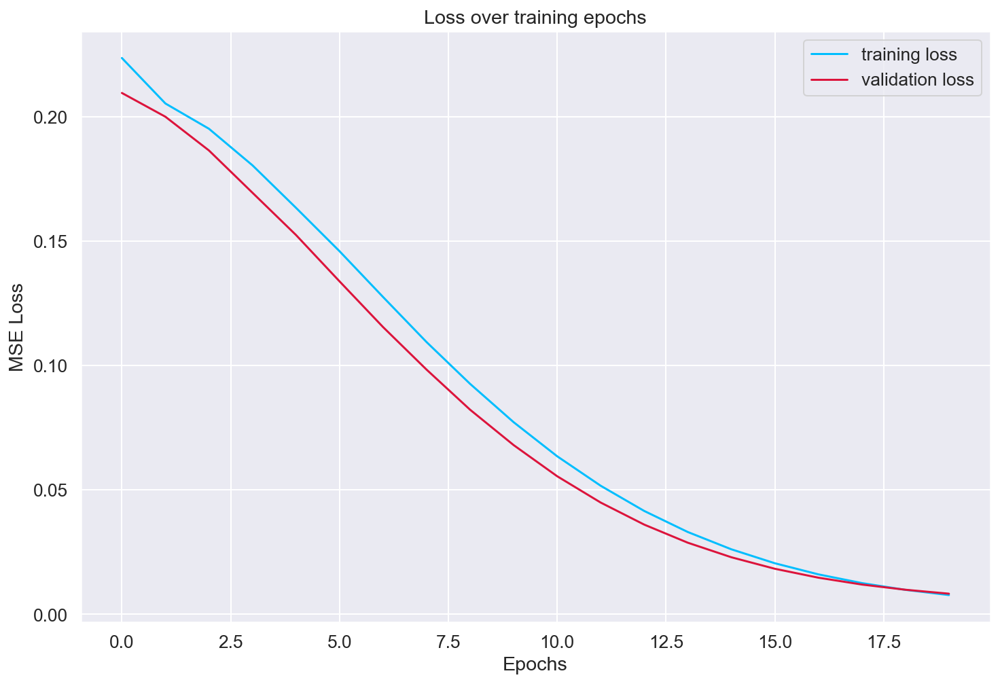

In [323]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('Loss over training epochs')
plt.legend(['training loss', 'validation loss'])
plt.show();

### Input vs Reconstruction for a Normal ECG

In [324]:
encoded_imgs = encoder(x_norm_test).numpy()
decoded_imgs = decoder(encoded_imgs).numpy()

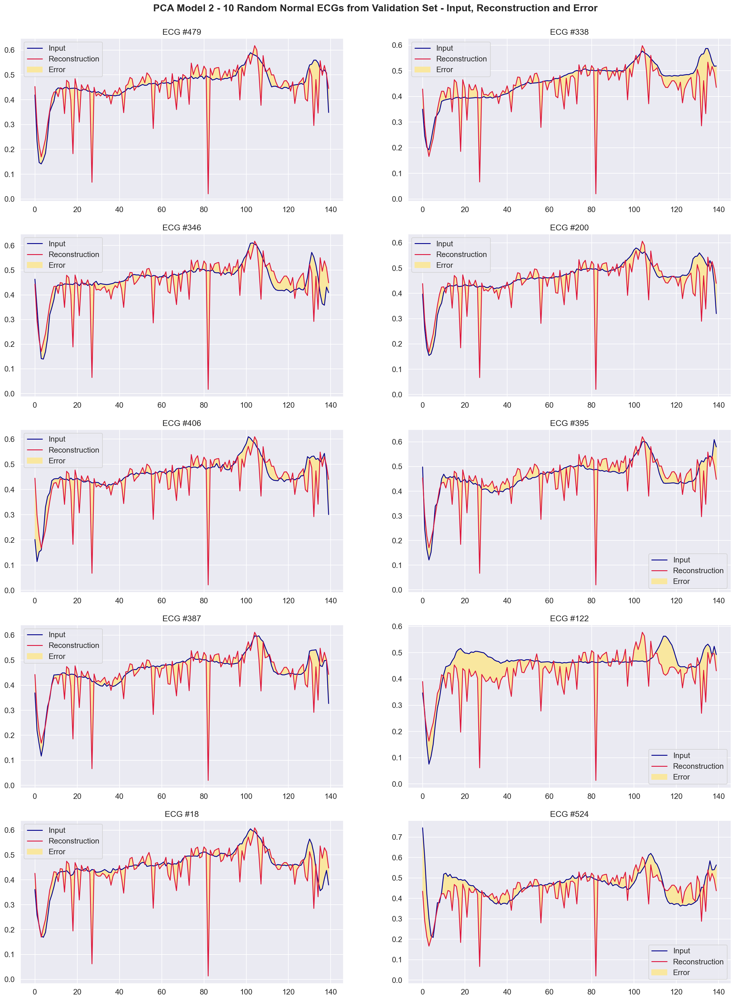

In [325]:
# Plot 10 random normal ECGs

a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(22,30))
fig.tight_layout()

for i in range(0,10):
    x = np.random.randint(low=0, high=(len(x_norm_test)-1))
    plt.subplot(a, b, c)
    plt.plot(x_norm_test[x],'darkblue',)
    plt.plot(decoded_imgs[x],'crimson')
    plt.fill_between(np.arange(140), decoded_imgs[x], x_norm_test[x], color='#F9E79F' )
    plt.title(f'ECG #{x+1}')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    c = c + 1

plt.suptitle('PCA Model 2 - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', 
             x=0.27, y=.9, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
plt.savefig('images/pca_model_2_norm_in_out.png', dpi=300, pad_inches=0.1,)
plt.show()

### Input vs Reconstruction for an Abnormal ECG

In [326]:
encoded_imgs = encoder(x_abnorm_test).numpy()
decoded_imgs = decoder(encoded_imgs).numpy()

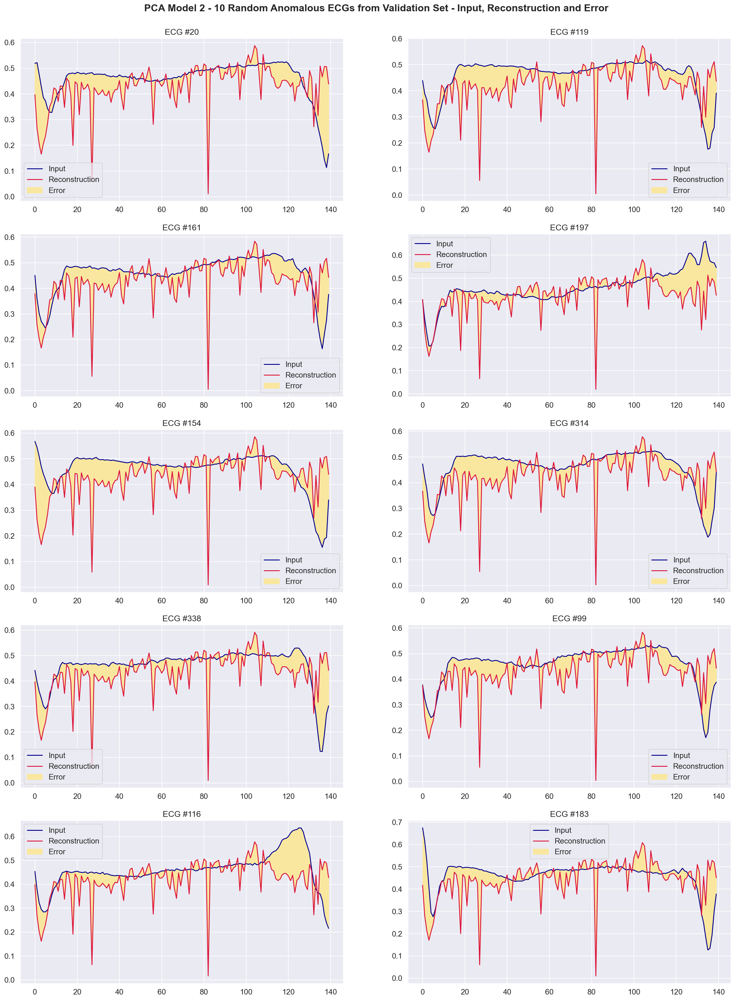

In [327]:
# Plot 10 random abnormal ECGs

a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(22,30))
fig.tight_layout()

for i in range(0,10):
    x = np.random.randint(low=0, high=(len(x_abnorm_test)-1))
    plt.subplot(a, b, c)
    plt.plot(x_abnorm_test[x],'darkblue',)
    plt.plot(decoded_imgs[x],'crimson')
    plt.fill_between(np.arange(140), decoded_imgs[x], x_abnorm_test[x], color='#F9E79F' )
    plt.title(f'ECG #{x+1}')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    c = c + 1

plt.suptitle('PCA Model 2 - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', 
             x=0.26, y=.9, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
plt.savefig('images/pca_model_2_abnorm_in_out.png', dpi=300, pad_inches=0.1,)
plt.show()

### Finding anomalous ECGs

We are calculating the mean squared error from examples from the normal training set, and then classifying as anomalous examples from the test set where the reconstruction error is 1 standard deviation from the training set.

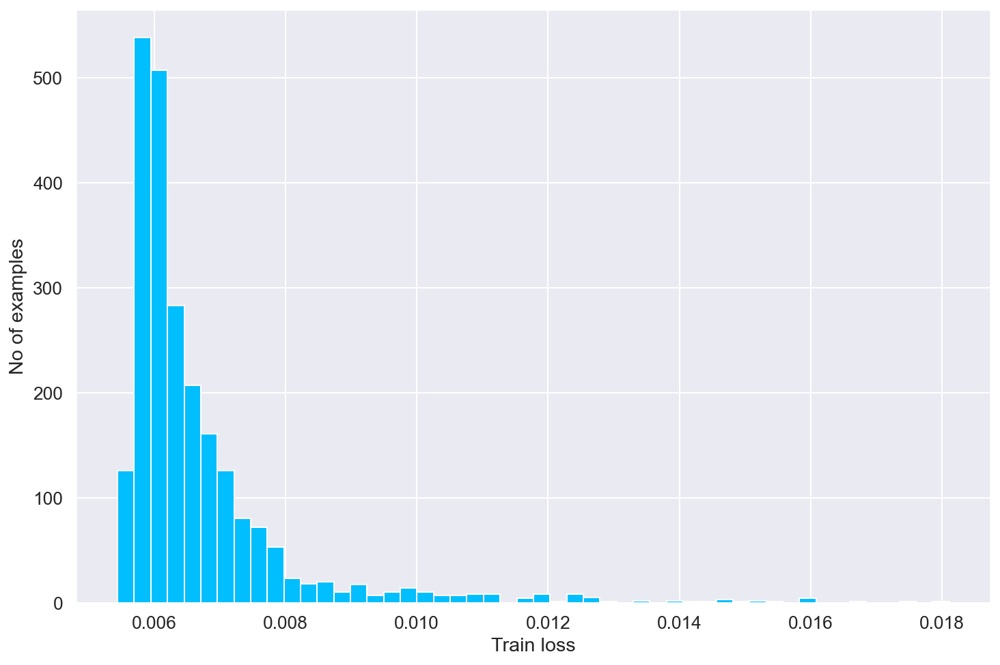

In [328]:
reconstructions = pca_model_2.predict(x_norm_train)
train_loss = tf.keras.losses.mse(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=50)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

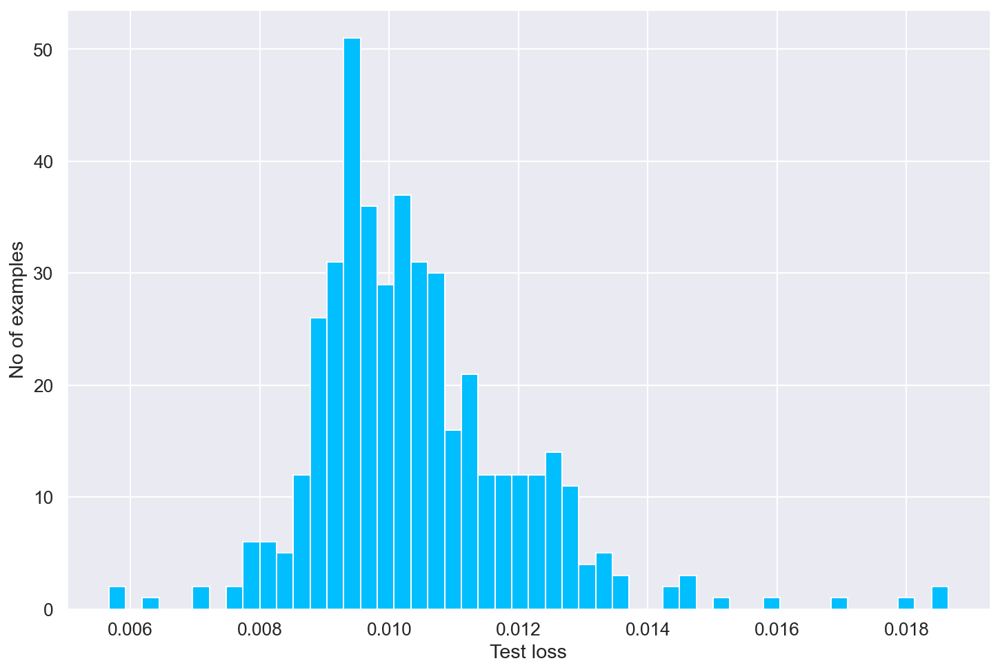

In [329]:
reconstructions = pca_model_2.predict(x_abnorm_test)
test_loss = tf.keras.losses.mse(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=50)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [330]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.mse(reconstructions, x_train_scaled)

  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.mse(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

In [331]:
threshold = find_threshold(pca_model_2, x_norm_train)
print(f"Threshold: {threshold}")

Threshold: 0.008048033341765404


In [332]:
preds = get_predictions(pca_model_2, x_test, threshold)
preds.shape

(1000,)

In [333]:
def print_stats(predictions, labels):
  print(f"Accuracy = {accuracy_score(labels, preds)}")
  print(f"Precision = {precision_score(labels, preds)}")
  print(f"Recall = {recall_score(labels, preds)}")

In [334]:
print_stats(preds, y_test)

Accuracy = 0.93
Precision = 0.9693486590038314
Recall = 0.9035714285714286


#### Calculate F1 score and Area Under the Curve (AUC)

In [335]:
from sklearn.metrics import auc

precision, recall, thresholds = precision_recall_curve(y_test, preds)
auc = auc(recall, precision)
f1 = f1_score(y_test, preds)

#### Plot AUC & Confusion Matrix

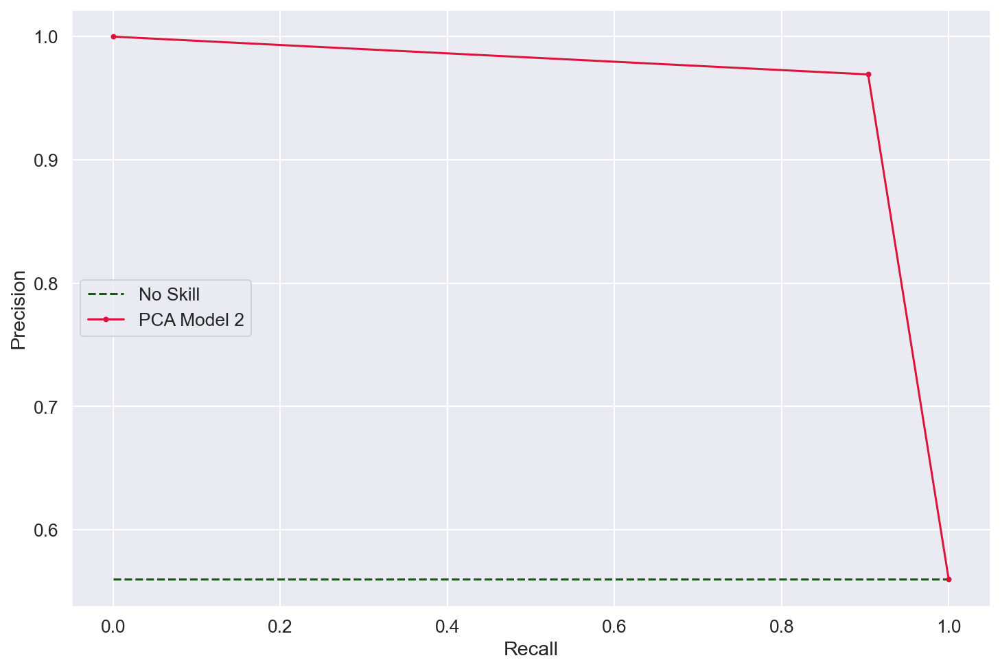

In [336]:
# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', color = 'darkgreen',label='No Skill')
plt.plot(recall, precision, marker='.', color = 'crimson', label='PCA Model 2')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()
plt.show();

In [337]:
# summarize scores
print('Autoencoder - PCA Model 2: f1=%.3f auc=%.3f' % (f1, auc))

Autoencoder - PCA Model 2: f1=0.935 auc=0.963


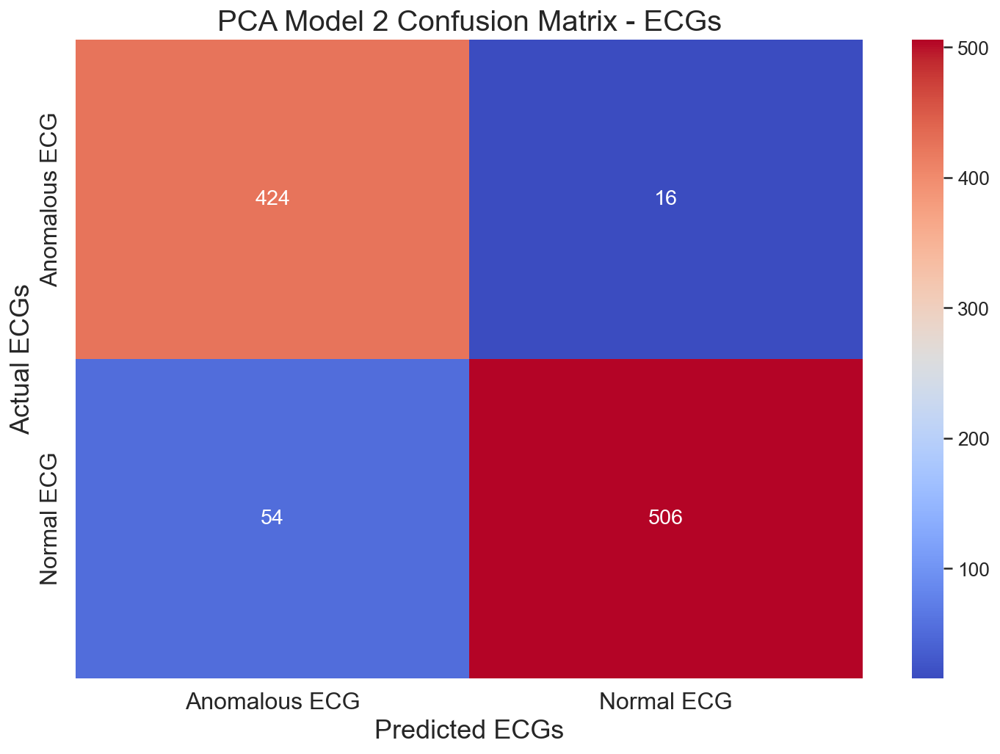

In [338]:
# Plot Confusion Matrix

cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('PCA Model 2 Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/pca_model_2_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This model actually performed worse. The reconstructions on the training data leave a lot to be desired, which means our residuals are still quite high. We need the model to fit the reconstructions better to the original training data before we can trust the results, so let's move on to something different.  We'll leave the PCA model with it's linear activations and move to a more true version of an autoencoder, with non-linear activations.

## Non-Linear Neural Network

In [339]:
encoder = tf.keras.Sequential([
      Dense(64, activation='relu'),
      Dropout(0.1),
      Dense(32, activation='relu'),
      Dropout(0.1),
      Dense(16, activation='relu'),
      Dropout(0.1),
      Dense(4, activation='relu')
    ])   

In [340]:
decoder = tf.keras.Sequential([
      layers.Dense(16, activation="relu"),
      layers.Dense(32, activation="relu"),
      layers.Dense(140, activation="sigmoid")])

In [341]:
seq_model_1 = Sequential([encoder, decoder])

In [342]:
seq_model_1.compile(loss='mae', optimizer='adam')

In [343]:
history = seq_model_1.fit(
    x_norm_train,
    x_norm_train,
    epochs=100,
    batch_size=512,
    shuffle=True,
    validation_data=(x_test, x_test)
)

Epoch 1/100
5/5 [==============================] - 1s 27ms/step - loss: 0.0571 - val_loss: 0.0520
Epoch 2/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0545 - val_loss: 0.0501
Epoch 3/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0515 - val_loss: 0.0482
Epoch 4/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0482 - val_loss: 0.0459
Epoch 5/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0446 - val_loss: 0.0440
Epoch 6/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0409 - val_loss: 0.0422
Epoch 7/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0374 - val_loss: 0.0406
Epoch 8/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0345 - val_loss: 0.0394
Epoch 9/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0320 - val_loss: 0.0383
Epoch 10/100
5/5 [==============================] - 0s 7ms/step - loss: 0.0297 - val_loss: 0.0372
Epoch 11/100
5/5 [==========

In [344]:
seq_model_1.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_8 (Sequential)   (None, 4)                 11700     
                                                                 
 sequential_9 (Sequential)   (None, 140)               5244      
                                                                 
Total params: 16,944
Trainable params: 16,944
Non-trainable params: 0
_________________________________________________________________


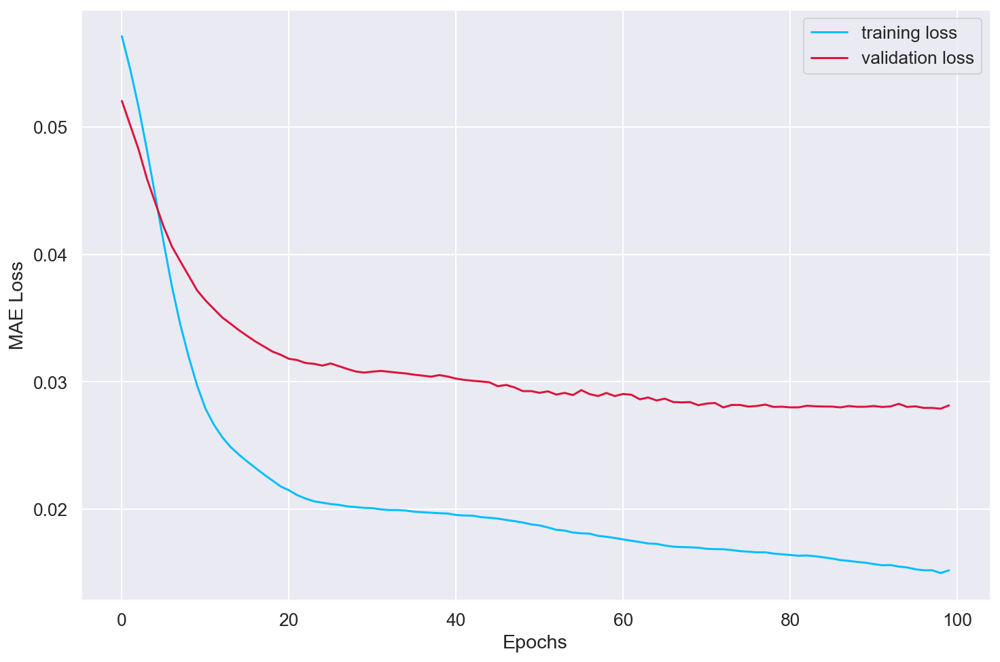

In [345]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MAE Loss')
plt.legend(['training loss', 'validation loss'])
plt.show()

In [346]:
encoded_imgs = encoder(x_norm_test).numpy()
decoded_imgs = decoder(encoded_imgs).numpy()

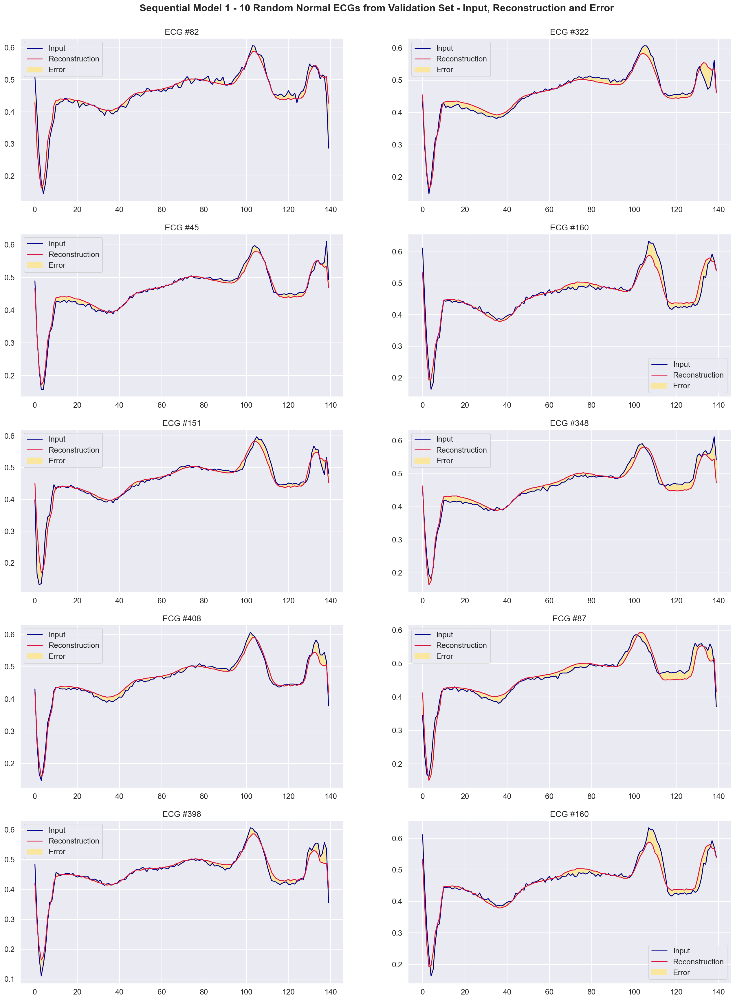

In [347]:
# Plot 10 random normal ECGs

a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(22,30))
fig.tight_layout()

for i in range(0,10):
    x = np.random.randint(low=0, high=(len(x_norm_test)-1))
    plt.subplot(a, b, c)
    plt.plot(x_norm_test[x],'darkblue',)
    plt.plot(decoded_imgs[x],'crimson')
    plt.fill_between(np.arange(140), decoded_imgs[x], x_norm_test[x], color='#F9E79F' )
    plt.title(f'ECG #{x+1}')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    c = c + 1

plt.suptitle('Sequential Model 1 - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', 
             x=0.255, y=.9, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
plt.savefig('images/seq_model_1_norm_in_out.png', dpi=300, pad_inches=0.1,)
plt.show()

In [348]:
encoded_imgs = encoder(x_abnorm_test).numpy()
decoded_imgs = decoder(encoded_imgs).numpy()

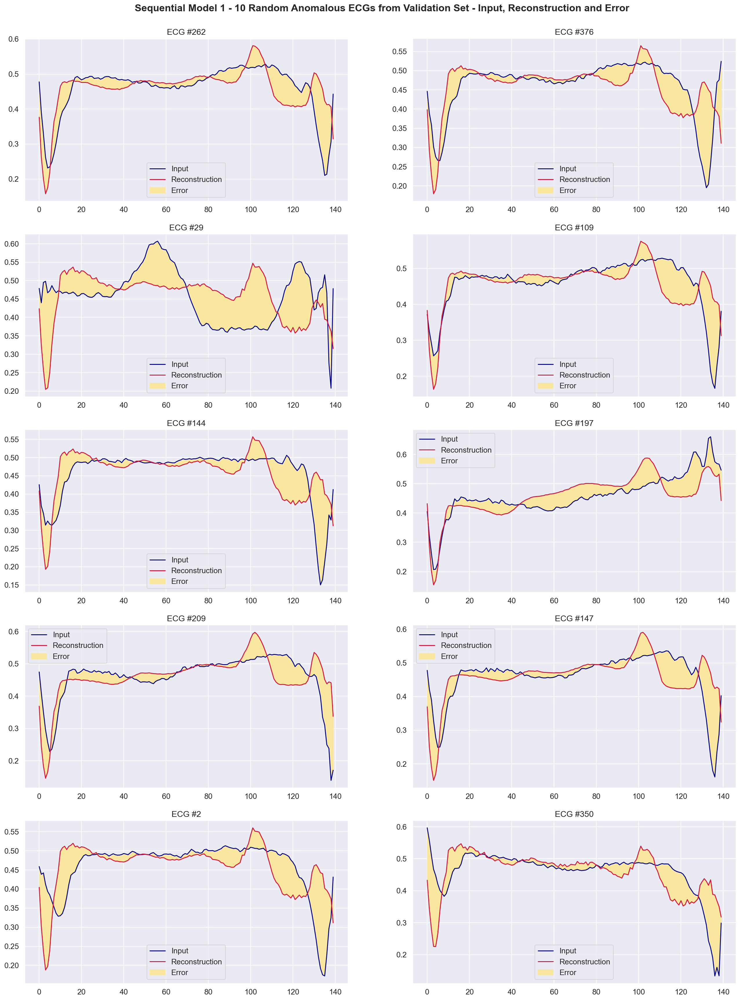

In [349]:
# Plot 10 random abnormal ECGs

a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(22,30))
fig.tight_layout()

for i in range(0,10):
    x = np.random.randint(low=0, high=(len(x_abnorm_test)-1))
    plt.subplot(a, b, c)
    plt.plot(x_abnorm_test[x],'darkblue',)
    plt.plot(decoded_imgs[x],'crimson')
    plt.fill_between(np.arange(140), decoded_imgs[x], x_abnorm_test[x], color='#F9E79F' )
    plt.title(f'ECG #{x+1}')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    c = c + 1

plt.suptitle('Sequential Model 1 - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', 
             x=0.245, y=.9, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
plt.savefig('images/seq_model_1_abnorm_in_out.png', dpi=300, pad_inches=0.1,)
plt.show()

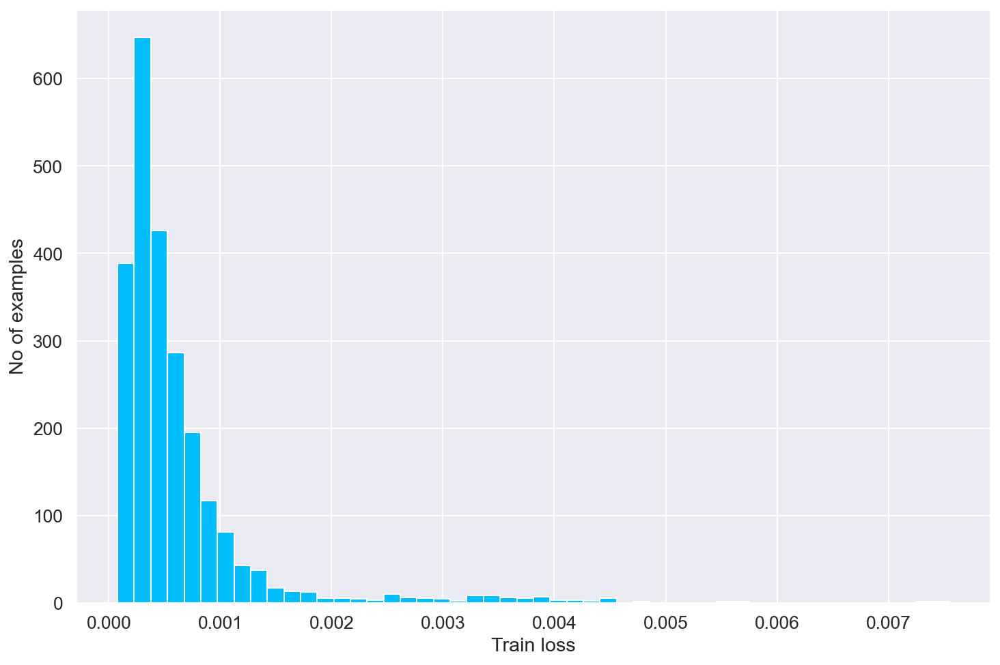

In [350]:
reconstructions = seq_model_1.predict(x_norm_train)
train_loss = tf.keras.losses.mse(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=50)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

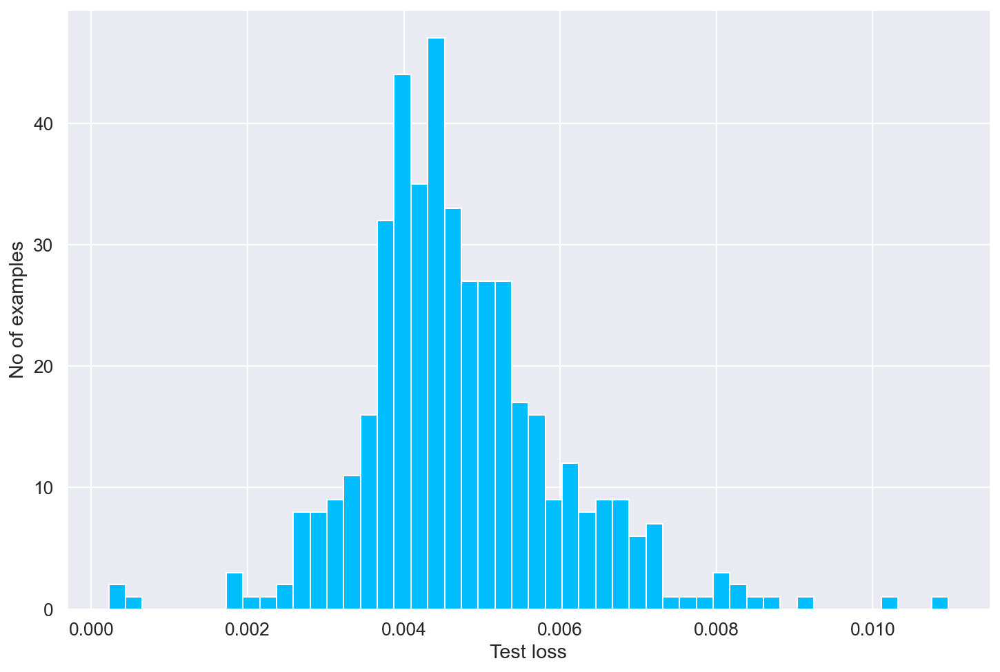

In [351]:
reconstructions = seq_model_1.predict(x_abnorm_test)
test_loss = tf.keras.losses.mse(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=50)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [352]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.mae(reconstructions, x_train_scaled)

  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.mae(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

In [353]:
threshold = find_threshold(seq_model_1, x_norm_train)
print(f"Threshold: {threshold}")

Threshold: 0.021856943145394325


In [354]:
preds = get_predictions(seq_model_1, x_test, threshold)

In [355]:
def print_stats(predictions, labels):
  print(f"Accuracy = {accuracy_score(labels, preds)}")
  print(f"Precision = {precision_score(labels, preds)}")
  print(f"Recall = {recall_score(labels, preds)}")

In [356]:
print_stats(preds, y_test)

Accuracy = 0.944
Precision = 0.9941176470588236
Recall = 0.9053571428571429


#### Calculate F1 score and Area Under the Curve (AUC)

In [357]:
from sklearn.metrics import auc

precision, recall, thresholds = precision_recall_curve(y_test, preds)
auc = auc(recall, precision)
f1 = f1_score(y_test, preds)

#### Plot AUC & Confusion Matrix

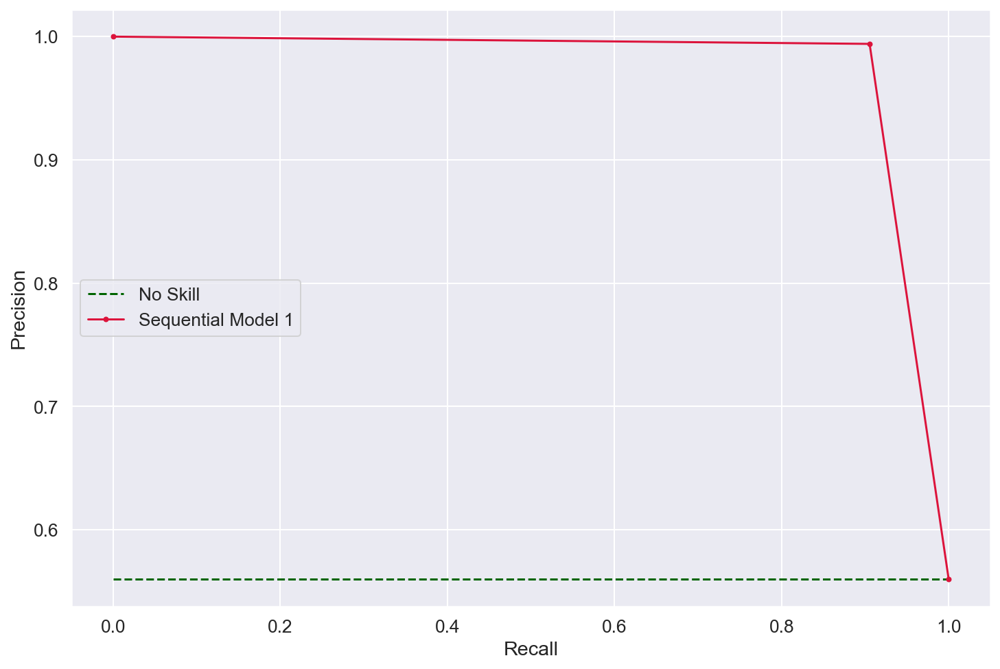

In [358]:
# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', color = 'darkgreen',label='No Skill')
plt.plot(recall, precision, marker='.', color = 'crimson', label='Sequential Model 1')
# axis labels
plt.xlabel('Recall')
plt.ylabel('Precision')
# show the legend
plt.legend()
# show the plot
plt.show();


In [359]:
# summarize scores
print('Sequential Model 1: f1=%.3f auc=%.3f' % (f1, auc))

Sequential Model 1: f1=0.948 auc=0.976


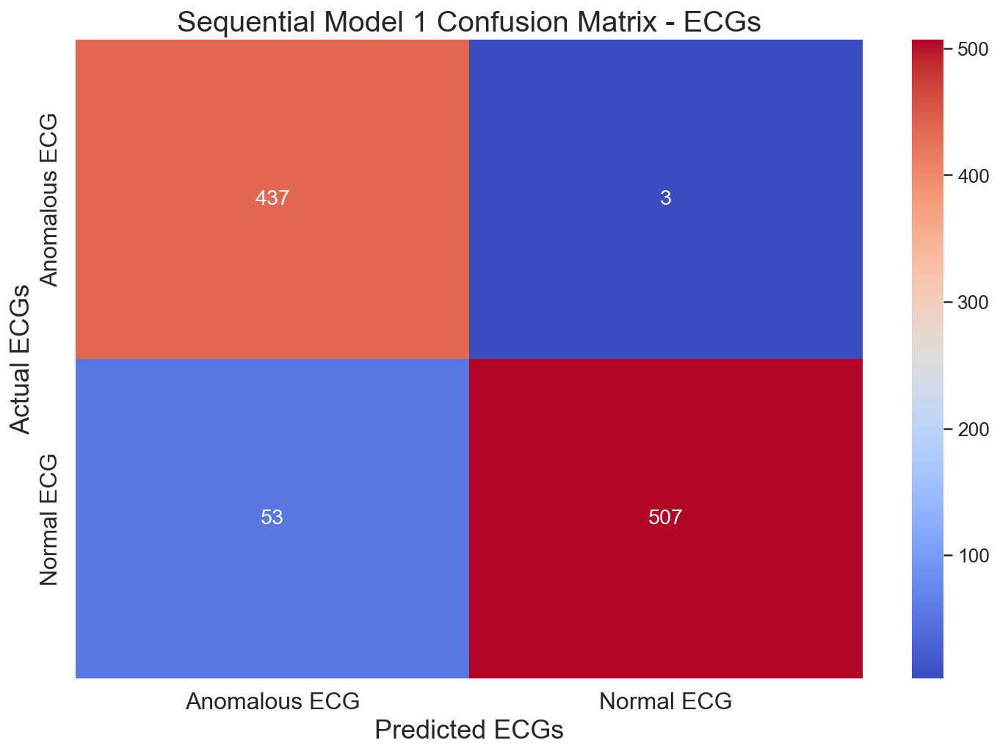

In [360]:
# Plot Confusion Matrix

cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Sequential Model 1 Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/seq_model_1_cm.png', dpi=300, pad_inches=0.1,)
plt.show()

This is progress - we're definitely doing well in minimizing the misidentified anomalous ECGs.  But, we'd like to see the number in the bottom left of the matrix go down, also.  Below is a function that will look for our best parameters for this model and store our results in a dictionary.  Let see how it does.

### Searching for the best model

Code adapted from [analyticvidhya.com](https://www.analyticsvidhya.com/blog/2021/05/anomaly-detection-using-autoencoders-a-walk-through-in-python/)

In [361]:
import keras_tuner as kt

class AutoEncoderTuner(Model):

  def __init__(self, hp, output_units, code_size=8):
    super().__init__()
    dense_1_units = hp.Int('dense_1_units', min_value=16, max_value=72, step=4)
    dense_2_units = hp.Int('dense_2_units', min_value=16, max_value=72, step=4)
    dense_3_units = hp.Int('dense_3_units', min_value=16, max_value=72, step=4)
    dense_4_units = hp.Int('dense_4_units', min_value=16, max_value=72, step=4)
    dense_5_units = hp.Int('dense_5_units', min_value=16, max_value=72, step=4)
    dense_6_units = hp.Int('dense_6_units', min_value=16, max_value=72, step=4)
    
    self.encoder = Sequential([
      Dense(dense_1_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_2_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_3_units, activation='relu'),
      Dropout(0.1),
      Dense(code_size, activation='relu')
    ])
    self.decoder = Sequential([
      Dense(dense_4_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_5_units, activation='relu'),
      Dropout(0.1),
      Dense(dense_6_units, activation='relu'),
      Dropout(0.1),
      Dense(output_units, activation='sigmoid')
    ])
  
  def call(self, inputs):
    encoded = self.encoder(inputs)
    decoded = self.decoder(encoded)
    return decoded


def build_model(hp):
  model = AutoEncoderTuner(hp, 140)
  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])
  model.compile(
      loss='mae',
      optimizer=Adam(learning_rate=hp_learning_rate),
  )
  return model

In [362]:
tuner = kt.Hyperband(
    build_model,
    objective='val_loss',
    max_epochs=20,
    factor=4,
    directory='autoencoder',
    project_name='tuning_autoencoder6'
)

tuner.search(
    x_norm_train, 
    x_norm_train, 
    epochs=20, 
    batch_size=512,
    validation_data=(x_norm_test, x_norm_test)
)

INFO:tensorflow:Reloading Oracle from existing project autoencoder/tuning_autoencoder6/oracle.json
INFO:tensorflow:Reloading Tuner from autoencoder/tuning_autoencoder6/tuner0.json
INFO:tensorflow:Oracle triggered exit


In [363]:
hparams = [f'dense_{i}_units' for i in range(1,7)] + ['learning_rate']
best_hyperparams = tuner.get_best_hyperparameters()
for hps in hparams:
  print(f"{hps}: {best_hyperparams[0][hps]}")

dense_1_units: 36
dense_2_units: 60
dense_3_units: 20
dense_4_units: 56
dense_5_units: 24
dense_6_units: 20
learning_rate: 0.01


In [364]:
best_model = tuner.get_best_models()[0]
best_model.compile(loss='mae', optimizer=Adam(0.001))

best_model.fit(
    x_norm_train,
    x_norm_train,
    epochs=20,
    batch_size=512,
    validation_data=(x_test, x_test))

Epoch 1/20
5/5 [==============================] - 1s 30ms/step - loss: 0.0211 - val_loss: 0.0341
Epoch 2/20
5/5 [==============================] - 0s 7ms/step - loss: 0.0211 - val_loss: 0.0339
Epoch 3/20
5/5 [==============================] - 0s 8ms/step - loss: 0.0210 - val_loss: 0.0340
Epoch 4/20
5/5 [==============================] - 0s 8ms/step - loss: 0.0209 - val_loss: 0.0337
Epoch 5/20
5/5 [==============================] - 0s 8ms/step - loss: 0.0209 - val_loss: 0.0337
Epoch 6/20
5/5 [==============================] - 0s 7ms/step - loss: 0.0209 - val_loss: 0.0337
Epoch 7/20
5/5 [==============================] - 0s 8ms/step - loss: 0.0208 - val_loss: 0.0334
Epoch 8/20
5/5 [==============================] - 0s 7ms/step - loss: 0.0207 - val_loss: 0.0335
Epoch 9/20
5/5 [==============================] - 0s 8ms/step - loss: 0.0206 - val_loss: 0.0333
Epoch 10/20
5/5 [==============================] - 0s 7ms/step - loss: 0.0206 - val_loss: 0.0332
Epoch 11/20
5/5 [=====================

In [365]:
threshold_ = find_threshold(best_model, x_norm_train)
preds_ = get_predictions(best_model, x_test, threshold_)
accuracy_score(preds_, y_test)

0.947

In [366]:
best_model.summary()

Model: "auto_encoder_tuner"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 8)                 8684      
                                                                 
 sequential_1 (Sequential)   (None, 140)               5312      
                                                                 
Total params: 13,996
Trainable params: 13,996
Non-trainable params: 0
_________________________________________________________________


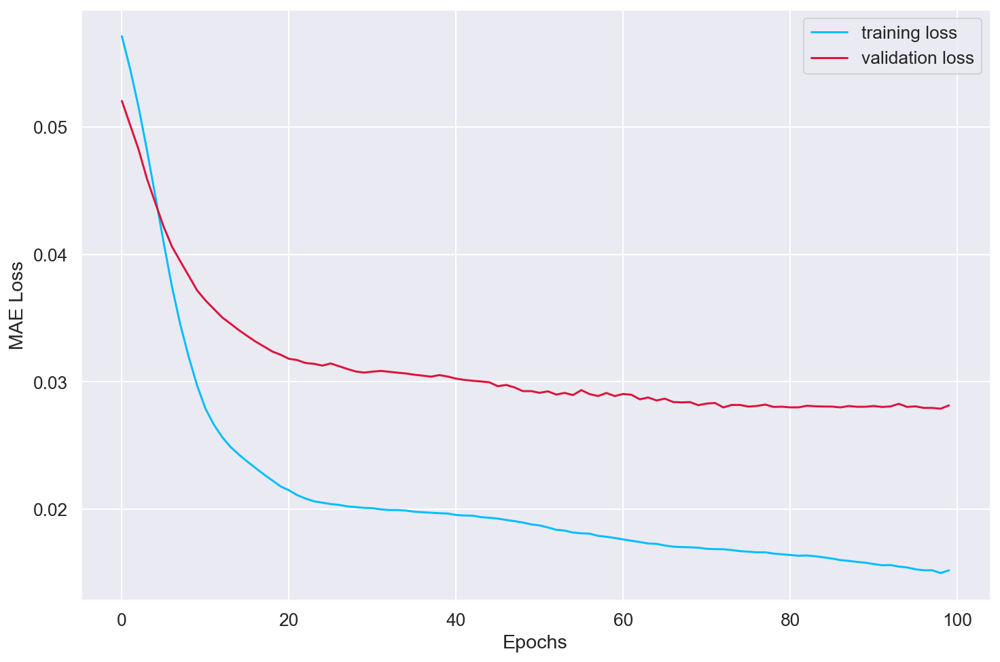

In [367]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'],color='crimson')
plt.xlabel('Epochs')
plt.ylabel('MAE Loss')
plt.legend(['training loss', 'validation loss'])
plt.show()

In [368]:
encoded_imgs = encoder(x_norm_test).numpy()
decoded_imgs = decoder(encoded_imgs).numpy()

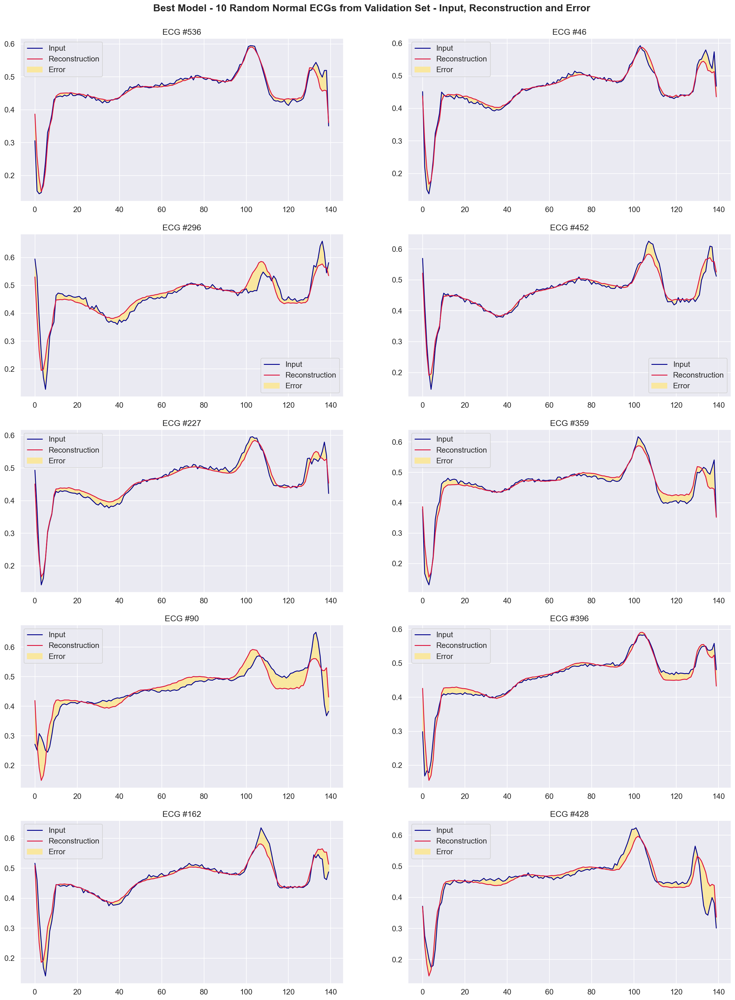

In [369]:
# Plot 10 random normal ECGs

a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(22,30))
fig.tight_layout()

for i in range(0,10):
    x = np.random.randint(low=0, high=(len(x_norm_test)-1))
    plt.subplot(a, b, c)
    plt.plot(x_norm_test[x],'darkblue',)
    plt.plot(decoded_imgs[x],'crimson')
    plt.fill_between(np.arange(140), decoded_imgs[x], x_norm_test[x], color='#F9E79F' )
    plt.title(f'ECG #{x+1}')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    c = c + 1

plt.suptitle('Best Model - 10 Random Normal ECGs from Validation Set - Input, Reconstruction and Error', 
             x=0.27, y=.9, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
plt.savefig('images/best_model_norm_in_out.png', dpi=300, pad_inches=0.1,)
plt.show()

In [370]:
encoded_imgs = encoder(x_abnorm_test).numpy()
decoded_imgs = decoder(encoded_imgs).numpy()

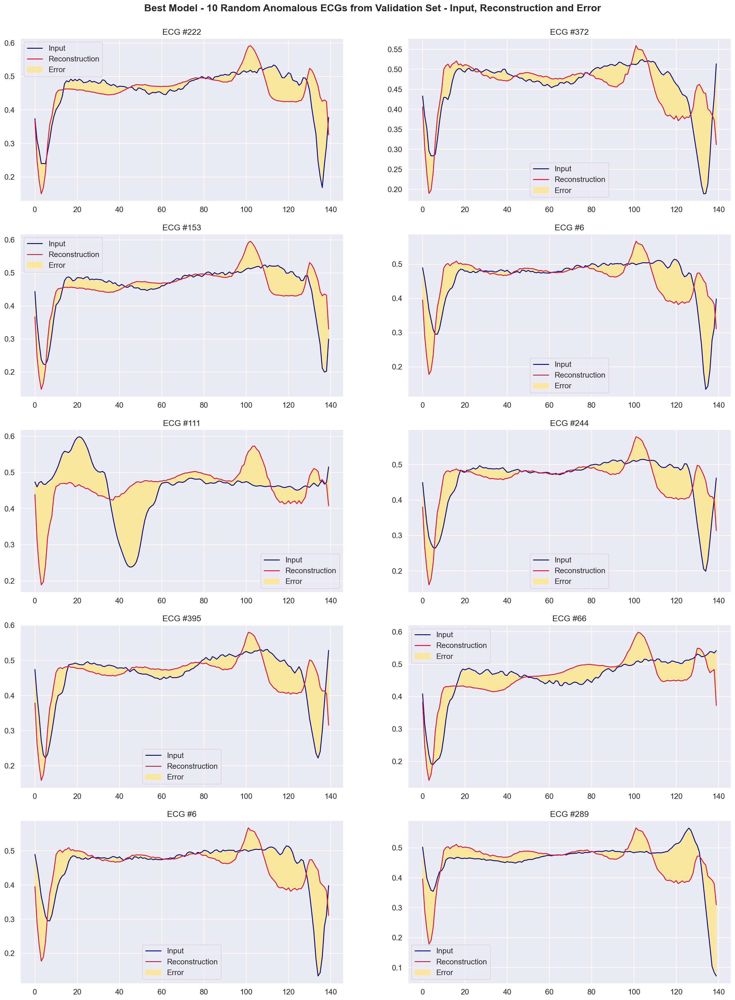

In [371]:
# Plot 10 random abnormal ECGs

a = 5  # number of rows
b = 2  # number of columns
c = 1  # initialize plot counter

fig = plt.figure(figsize=(22,30))
fig.tight_layout()

for i in range(0,10):
    x = np.random.randint(low=0, high=(len(x_abnorm_test)-1))
    plt.subplot(a, b, c)
    plt.plot(x_abnorm_test[x],'darkblue',)
    plt.plot(decoded_imgs[x],'crimson')
    plt.fill_between(np.arange(140), decoded_imgs[x], x_abnorm_test[x], color='#F9E79F' )
    plt.title(f'ECG #{x+1}')
    plt.legend(labels=["Input", "Reconstruction", "Error"])
    c = c + 1

plt.suptitle('Best Model - 10 Random Anomalous ECGs from Validation Set - Input, Reconstruction and Error', 
             x=0.26, y=.9, 
             horizontalalignment='left', 
             verticalalignment='bottom', 
             fontweight ="bold")
plt.savefig('images/best_model_abnorm_in_out.png', dpi=300, pad_inches=0.1,)
plt.show()

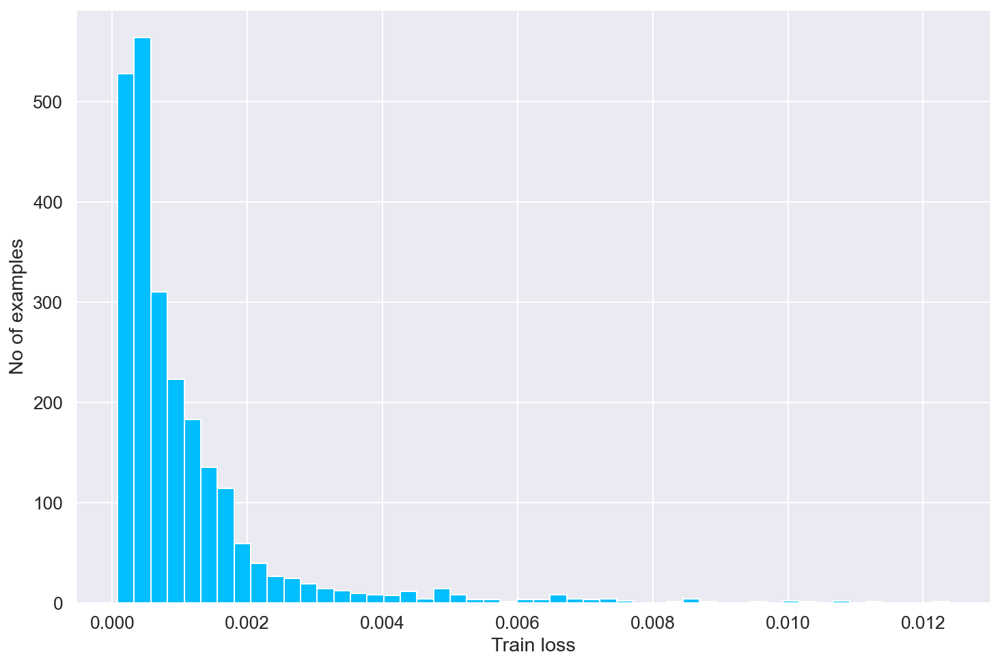

In [372]:
reconstructions = best_model.predict(x_norm_train)
train_loss = tf.keras.losses.mse(x_norm_train, reconstructions)

plt.hist(train_loss.numpy(), bins=50)
plt.xlabel("Train loss")
plt.ylabel("No of examples")
plt.show()

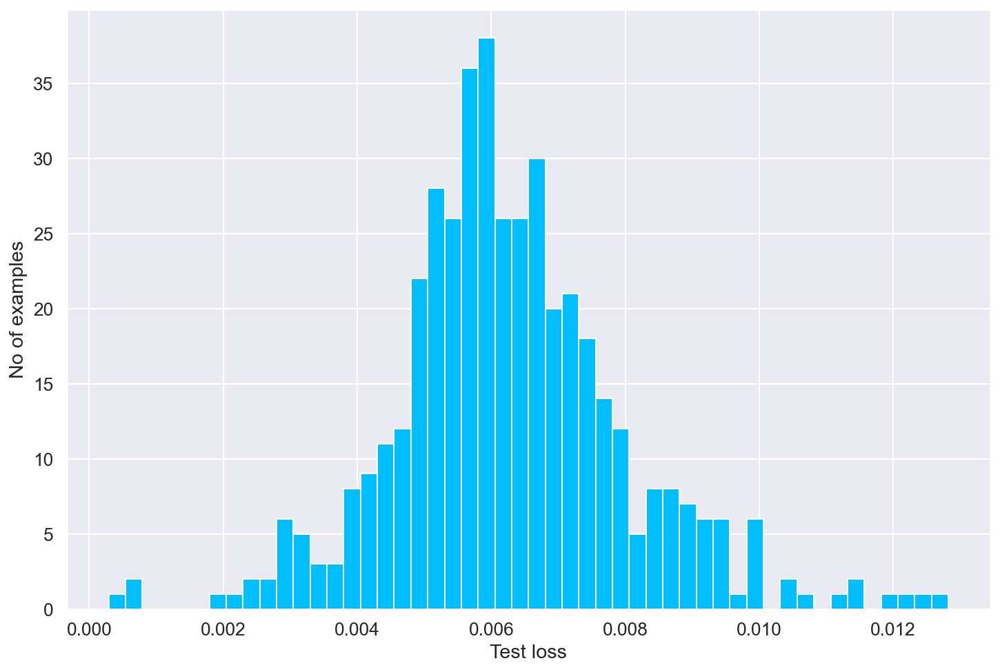

In [373]:
reconstructions = best_model.predict(x_abnorm_test)
test_loss = tf.keras.losses.mse(reconstructions, x_abnorm_test)

plt.hist(test_loss.numpy(), bins=50)
plt.xlabel("Test loss")
plt.ylabel("No of examples")
plt.show()

In [374]:
def find_threshold(model, x_train_scaled):
  reconstructions = model.predict(x_train_scaled)
  # provides losses of individual instances
  reconstruction_errors = tf.keras.losses.mae(reconstructions, x_train_scaled)

  # threshold for anomaly scores
  threshold = np.mean(reconstruction_errors.numpy()) \
      + np.std(reconstruction_errors.numpy())
  return threshold

def get_predictions(model, x_test_scaled, threshold):
  predictions = model.predict(x_test_scaled)
  # provides losses of individual instances
  errors = tf.keras.losses.mae(predictions, x_test_scaled)
  # 0 = anomaly, 1 = normal
  anomaly_mask = pd.Series(errors) > threshold
  preds = anomaly_mask.map(lambda x: 0.0 if x == True else 1.0)
  return preds

In [375]:
threshold = find_threshold(best_model, x_norm_train)
print(f"Threshold: {threshold}")

Threshold: 0.03050808608531952


In [376]:
preds = get_predictions(best_model, x_test, threshold)

In [377]:
def print_stats(predictions, labels):
  print(f"Accuracy = {accuracy_score(labels, preds)}")
  print(f"Precision = {precision_score(labels, preds)}")
  print(f"Recall = {recall_score(labels, preds)}")

In [378]:
print_stats(preds, y_test)

Accuracy = 0.947
Precision = 0.9941520467836257
Recall = 0.9107142857142857


#### Calculate F1 score and Area Under the Curve (AUC)

In [379]:
from sklearn.metrics import auc

precision, recall, thresholds = precision_recall_curve(y_test, preds)
auc = auc(recall, precision)
f1 = f1_score(y_test, preds)

#### Plot AUC & Confusion Matrix

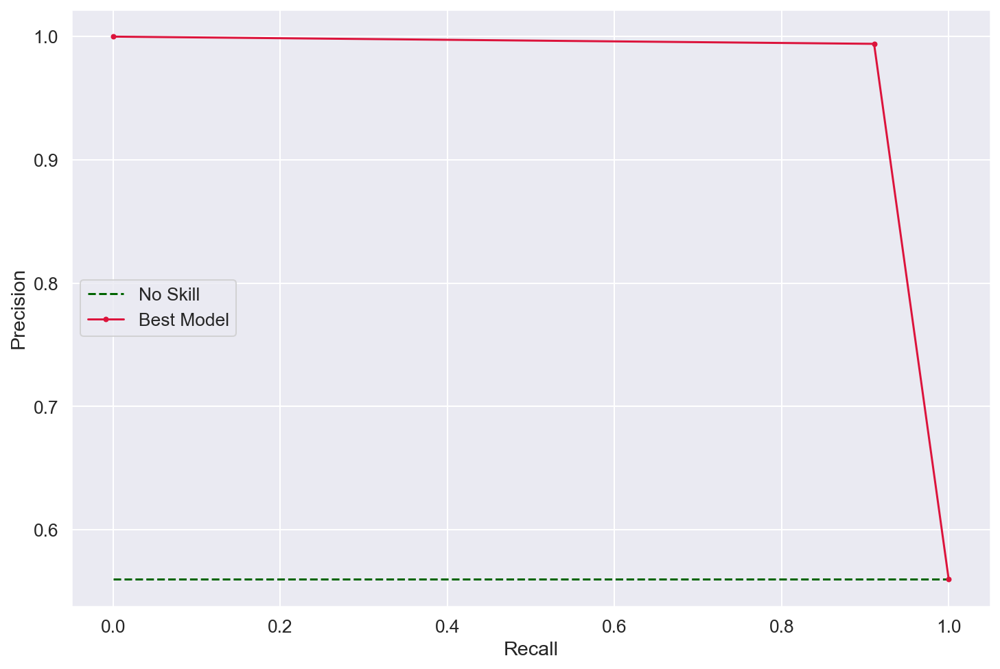

In [380]:
# plot the precision-recall curves
no_skill = len(y_test[y_test==1]) / len(y_test)
plt.plot([0, 1], [no_skill, no_skill], linestyle='--', color = 'darkgreen',label='No Skill')
plt.plot(recall, precision, marker='.', color = 'crimson', label='Best Model')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.legend()

plt.show();


In [381]:
# summarize scores
print('Autoencoder: f1=%.3f auc=%.3f' % (f1, auc))

Autoencoder: f1=0.951 auc=0.977


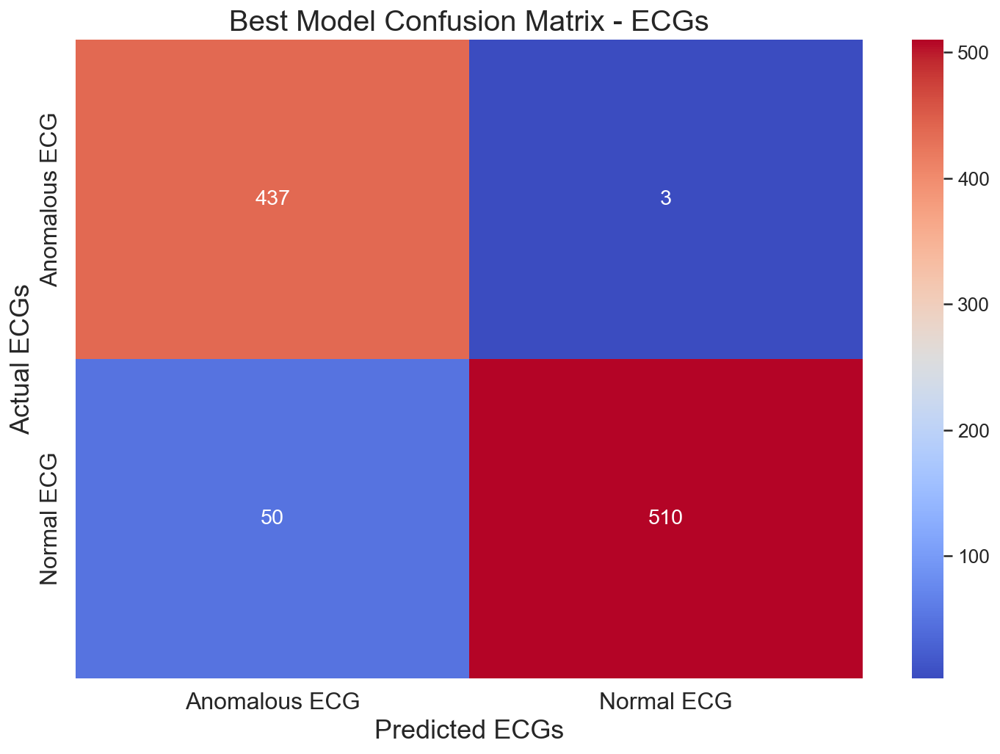

In [382]:
# Plot Confusion Matrix

cm = confusion_matrix(y_test, preds)
ax = sns.heatmap(cm, annot=True, fmt='g', cmap="coolwarm");
ax.set_title('Best Model Confusion Matrix - ECGs', fontsize=20);
ax.set_xlabel('Predicted ECGs',fontsize=18)
ax.set_ylabel('Actual ECGs',fontsize=18);
ax.xaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)
ax.yaxis.set_ticklabels(['Anomalous ECG', 'Normal ECG'],fontsize=16)

plt.savefig('images/best_model_cm.png', dpi=300, pad_inches=0.1,)
plt.show()